In [1]:
USE_CACHED_MODELS = True

# Introduction

<casey.durfee@colorado.edu>

For this assignment, we've been given the task of completing the "I'm something of a painter myself" challenge on kaggle. We were instructed we could use the [recommended CycleGAN tutorial](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial) as a jumping off point.

## The Big Idea behind GANs
In the Beatles song "You Never Give Me Your Money", Paul McCartney laments that instead of money, you always give him "your funny paper". In this situation, Paul has to discriminate whether the bill you gave him was "funny paper" or not. He was able to identify it as fake, but perhaps, you might try making another fake bill. If you manage to fool Paul, the next time he will know what to look for, and thus be harder to deceive. 

If the digital equivalents of you and Paul kept repeating this cycle over and over, eventually the digital you will get extremely good at creating fake money, and the digital Paul will get extremely good at detecting funny paper. The digital you is called the Generator, and the digital Paul is called the Discriminator. The two together form a Generative Adversarial Network (GAN). You have two AI models that start off not knowing anything, but they end up teaching each other.

In this problem, we are given a set of photos of the real world, and a set of Monet paintings. The Generator tries to create fake Monets based on real images, and the Discriminator tries to tell whether they are real or fake. Over time, the Generator will get good at art forgery, which will be useful for what I swear are completely legal reasons.

## CycleGAN
CycleGAN is a GAN designed to translate images from one domain to another. It actually trains two discriminators and two generators. Although we're only interested in turning photos into monets, CycleGAN will also learn to turn monets into photos.

Unsupervised learning requires guardrails to keep from going way off track. There's no expert or supervisor to judge whether the art is actually good. The CycleGAN architecture [Zhu 2017] uses penalties, cycle loss and identity loss, to keep things from getting too weird. 

Cycle loss is the amount of error when transforming from photo to monet and back (or from monet to photo and back). In a perfect situation, the monet to photo operation (M) and the photo to monet operation (P) would be inverses of each other, so if X is a photo, P(M(X)) = X. 

Identity loss is the amount of change from passing a real photo through the "make a fake photo" filter or passing a real Monet through the "make a fake monet" filter. The authors of the original paper found that cycle loss alone leads to poor results. Intuitively, it makes sense: a real Monet is already as Monet-like as an image can be. So trying to Monet-ify it even further should ideally lead to zero changes to the image.

I am going to start with the tutorial code, then try and improve on the Generator and Discriminator models.

## A note on sources
The next section is taken directly from the tutorial. A complete list of references is at the end. My work starts with the "Original Work Starts Here" heading.

I had to change code a bit because tensorflow_addons is no longer supported. According to this page, the group normalization layer with groups=-1 should be equivalent: https://keras.io/api/layers/normalization_layers/group_normalization/

I was also unable to get the code to run with TPUs. it will only work on GPUs. I get the following error when I use the TPU:

```Shapes of all inputs must match: values[0].shape = [1,30,30] != values[1].shape = [0,30,30]
	 [[{{node Mean_3/input}}]] [Op:__inference_one_step_on_iterator_103553]```

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#import tensorflow_addons as tfa

from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt
import numpy as np

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    if tf.config.list_physical_devices('GPU'):
        strategy = tf.distribute.MirroredStrategy()
        print("Running on GPU.")
    else:
        strategy = tf.distribute.get_strategy()
        print("Running on CPU.")
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

2024-08-05 16:54:25.620611: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-05 16:54:25.620671: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-05 16:54:25.622293: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Running on GPU.
Number of replicas: 1
2.15.0


In [3]:
GCS_PATH = KaggleDatasets().get_gcs_path()
MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))
print('Monet TFRecord Files:', len(MONET_FILENAMES))

PHOTO_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/*.tfrec'))
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))
IMAGE_SIZE = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

Monet TFRecord Files: 5
Photo TFRecord Files: 20


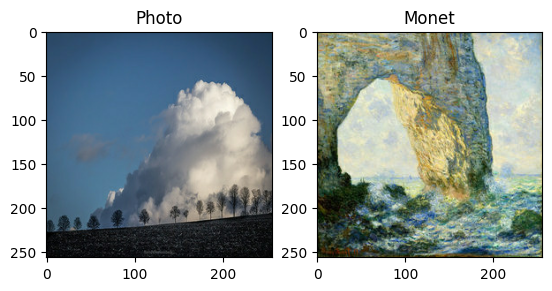

In [4]:
monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(1)
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))
plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0] * 0.5 + 0.5)

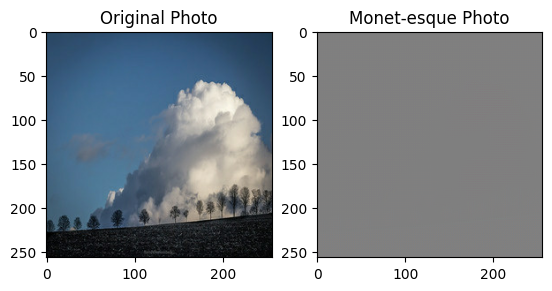

In [5]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        # casey: replaced defunct tfa
        result.add(layers.GroupNormalization(groups=-1, gamma_initializer=gamma_init))
        #result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))
        
    result.add(layers.LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    # casey: replaced defunct tfa
    result.add(layers.GroupNormalization(groups=-1, gamma_initializer=gamma_init))
    #result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))
    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    
    # casey: replace defunct tfa
    #norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)
    norm1 = layers.GroupNormalization(groups=-1, gamma_initializer=gamma_init)(conv)
   
    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator = Generator() # transforms photos to Monet-esque paintings
    photo_generator = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator = Discriminator() # differentiates real photos and generated photos
    to_monet = monet_generator(example_photo)

plt.subplot(1, 2, 1)
plt.title("Original Photo")
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(1, 2, 2)
plt.title("Monet-esque Photo")
plt.imshow(to_monet[0] * 0.5 + 0.5)
plt.show()

In [6]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            monet_identity_loss = self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            photo_identity_loss = self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + monet_identity_loss
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + photo_identity_loss

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss,
            "cycle_loss": total_cycle_loss,
            "monet_identity_loss": monet_identity_loss,
            "photo_identity_loss": photo_identity_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [7]:
def plot_results(monet_generator):
    _, ax = plt.subplots(5, 2, figsize=(12, 12))
    for i, img in enumerate(photo_ds.take(5)):
        prediction = monet_generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

        ax[i, 0].imshow(img)
        ax[i, 1].imshow(prediction)
        ax[i, 0].set_title("Input Photo")
        ax[i, 1].set_title("Monet-esque")
        ax[i, 0].axis("off")
        ax[i, 1].axis("off")
    plt.show()

In [8]:
class CustomCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        plot_results(self.model.m_gen)

if not USE_CACHED_MODELS:
    hist1 = cycle_gan_model.fit(
        tf.data.Dataset.zip((monet_ds, photo_ds)),
        epochs=5,
        callbacks=[CustomCallback()]
    )
    monet_generator.save("original_monet_generator.keras")
    monet_generator1 = monet_generator
else:
    monet_generator1 = tf.keras.models.load_model("original_monet_generator.keras")

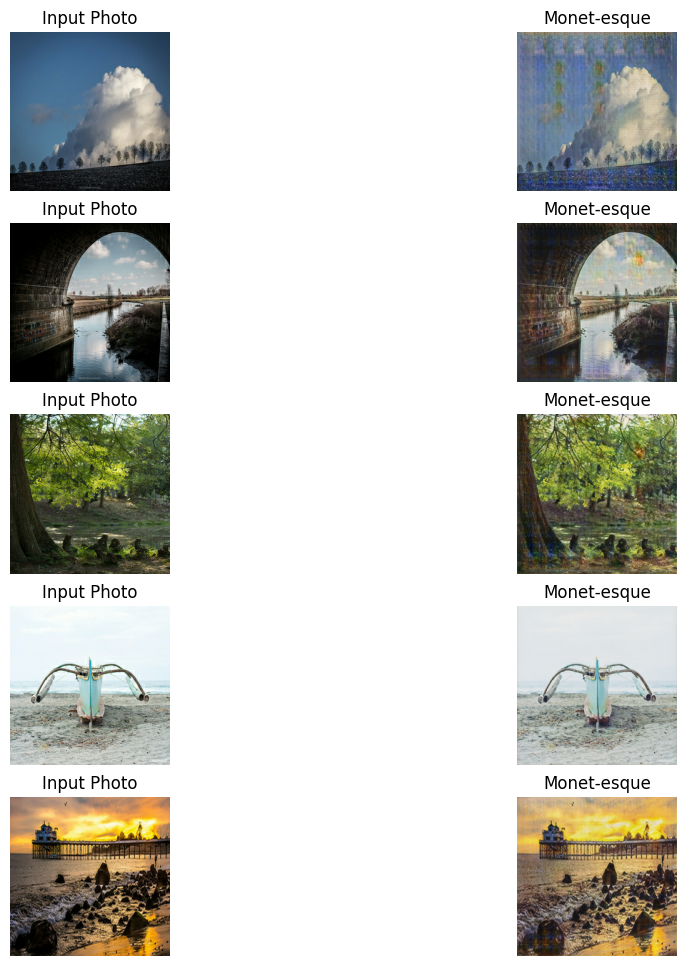

In [9]:
plot_results(monet_generator1)

# Original Work Starts Here

how can we make this introductory notebook better? It's very possible that with more generations of training, the weird artifacts would go away. But if you do what everybody else does, you'll probably get the results everybody else gets.

## Exploratory Data Analysis


In [10]:
# the data is lazy loaded
if not USE_CACHED_MODELS:
    num_photos=0
    for x in photo_ds:
        num_photos += 1

    print("num photos: ", num_photos)

    num_monets=0
    for x in monet_ds:
        num_monets += 1

    print("num monets: ", num_monets)

there are 7038 photos and 300 monets total. They are all 256x256x3 dimensions.  there is more exploratory data analysis later, when looking at the generated images.

## A new discriminator

My first idea is to create a different Discriminator model. How about using more convolutional layers? In the cancer detection project, I used a triple convolutional layer design that worked pretty well, so I'm reusing it here (with minor modifications)

In [11]:
def getAltDiscriminator():
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
    initializer = tf.random_normal_initializer(0., 0.02)
    return keras.Sequential(
        [
            keras.Input(shape=(256,256,3)),
            layers.ZeroPadding2D(),

            layers.Conv2D(64, kernel_size=(3, 3), activation="leaky_relu"),
            layers.Conv2D(64, kernel_size=(3, 3), activation="leaky_relu"),
            layers.Conv2D(64, kernel_size=(3, 3), activation="leaky_relu"),
            layers.MaxPooling2D(pool_size=(2, 2)),
            
            ## the following is basically the same as the original discriminator
            ## output needs to be 30x30x1
            downsample(128,4),
            downsample(256,4),
            layers.ZeroPadding2D(),
            layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False),
            layers.GroupNormalization(groups=-1, gamma_initializer=gamma_init),
            layers.LeakyReLU(),
            layers.ZeroPadding2D(),

            layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)

        ]
    )

In [12]:
Discriminator().summary()

Model: "functional_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_36 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_37 (Sequential)      │ (None, 64, 64, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_38 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_4                │ (None, 34, 34, 256)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ group_normalization_36          │ (None, 31, 31, 512)    │         1,024 │
│ (GroupNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_5                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,765,569 (10.55 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
getAltDiscriminator().summary()

Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ zero_padding2d_6                │ (None, 258, 258, 3)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 254, 254, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 252, 252, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 126, 126, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 63, 63, 128)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_40 (Sequential)      │ (None, 32, 32, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_7                │ (None, 34, 34, 256)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_36 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ group_normalization_39          │ (None, 31, 31, 512)    │         1,024 │
│ (GroupNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_8                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_37 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,838,145 (10.83 MB)

 Trainable params: 2,838,145 (10.83 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
with strategy.scope():
    monet_generator2 = Generator() # transforms photos to Monet-esque paintings
    photo_generator2 = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator2 = getAltDiscriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator2 = getAltDiscriminator() # differentiates real photos and generated photos
    to_monet = monet_generator2(example_photo)
    
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    cycle_gan_model2 = CycleGan(
        monet_generator2, photo_generator2, 
        monet_discriminator2, photo_discriminator2
    )

    cycle_gan_model2.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [15]:
class CustomCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        plot_results(self.model.m_gen)

if not USE_CACHED_MODELS:
    hist2 = cycle_gan_model2.fit(
        tf.data.Dataset.zip((monet_ds, photo_ds)),
        epochs=5,
        callbacks=[CustomCallback()]
    )
    monet_generator2.save("monet_generator2.keras")
else:
    monet_generator2 = tf.keras.models.load_model("monet_generator2.keras")

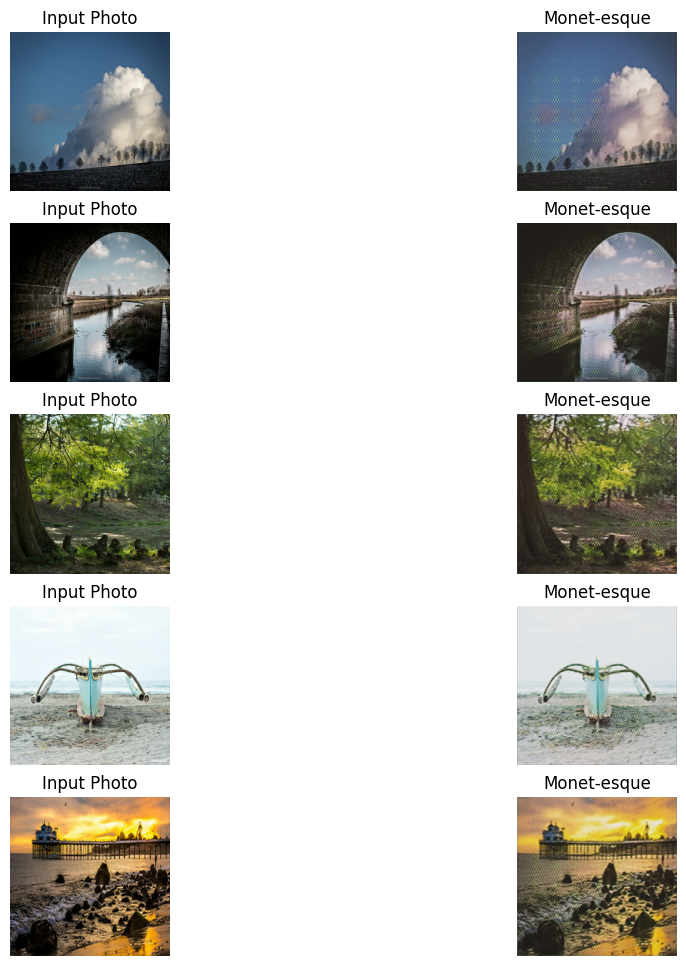

In [16]:
plot_results(monet_generator2)

OK, not bad. We didn't totally ruin things with the new Discriminator. It might even be a little better.

## Can We Improve On UNet?
The structure of the Generator probably matters more than the Discriminator. The default CycleGAN uses a model called UNet for the Generator.

I did some reading on improvements to UNet and came across this paper: https://www.nature.com/articles/s41523-021-00358-x

They created a model called a connected UNet, which is two UNets connected together (like a "W"). They had great success using it for cancer detection, so I figured I'd give it a shot for image generation.

The following code is heavily based on the paper's code found here: https://github.com/AsmaBaccouche/Connected-Unets-and-more/blob/main/Connected_Unets_segmnetation.py

I had to change the last layers of the model to output a 256x256x3 image.

In [17]:
from keras.layers import Input, concatenate, Conv2D, Add, MaxPooling2D, Conv2DTranspose, BatchNormalization
from keras.models import Model

def get_connected_unet():
    def aspp_block(x, num_filters, rate_scale=1):
        x1 = Conv2D(num_filters, (3, 3), dilation_rate=(6 * rate_scale, 6 * rate_scale), padding="same")(x)
        x1 = BatchNormalization()(x1)

        x2 = Conv2D(num_filters, (3, 3), dilation_rate=(12 * rate_scale, 12 * rate_scale), padding="same")(x)
        x2 = BatchNormalization()(x2)

        x3 = Conv2D(num_filters, (3, 3), dilation_rate=(18 * rate_scale, 18 * rate_scale), padding="same")(x)
        x3 = BatchNormalization()(x3)

        x4 = Conv2D(num_filters, (3, 3), padding="same")(x)
        x4 = BatchNormalization()(x4)

        y = Add()([x1, x2, x3, x4])
        y = Conv2D(num_filters, (1, 1), padding="same")(y)
        return y 

    def get_wnet():
        inputs = Input((256, 256, 3))
        conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
        conv1 = BatchNormalization()(conv1)
        conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
        conv1 = BatchNormalization()(conv1)
        pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

        conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
        conv2 = BatchNormalization()(conv2)
        conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
        conv2 = BatchNormalization()(conv2)
        pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

        conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
        conv3 = BatchNormalization()(conv3)
        conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
        conv3 = BatchNormalization()(conv3)
        pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

        conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
        conv4 = BatchNormalization()(conv4)
        conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
        conv4 = BatchNormalization()(conv4)
        pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

        conv5 = aspp_block(pool4, 512)

        up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
        conv6 = BatchNormalization()(conv6)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)
        conv6 = BatchNormalization()(conv6)

        up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
        conv7 = BatchNormalization()(conv7)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)
        conv7 = BatchNormalization()(conv7)

        up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
        conv8 = BatchNormalization()(conv8)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)
        conv8 = BatchNormalization()(conv8)

        up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
        conv9 = BatchNormalization()(conv9)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)
        conv9 = BatchNormalization()(conv9)

        down10 = concatenate([Conv2D(32, (3, 3), activation='relu', padding='same')(conv9), conv9], axis=3)
        conv10 = Conv2D(32, (3, 3), activation='relu', padding='same')(down10)
        conv10 = BatchNormalization()(conv10)
        conv10 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv10)
        conv10 = BatchNormalization()(conv10)    
        pool10 = MaxPooling2D(pool_size=(2, 2))(conv10)

        down11 = concatenate([Conv2D(64, (3, 3), activation='relu', padding='same')(pool10), conv8], axis=3)
        conv11 = Conv2D(64, (3, 3), activation='relu', padding='same')(down11)
        conv11 = BatchNormalization()(conv11)
        conv11 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv11)
        conv11 = BatchNormalization()(conv11)   
        pool11 = MaxPooling2D(pool_size=(2, 2))(conv11)

        down12 = concatenate([Conv2D(128, (3, 3), activation='relu', padding='same')(pool11), conv7], axis=3)
        conv12 = Conv2D(128, (3, 3), activation='relu', padding='same')(down12)
        conv12 = BatchNormalization()(conv12)
        conv12 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv12)    
        conv12 = BatchNormalization()(conv12)
        pool12 = MaxPooling2D(pool_size=(2, 2))(conv12)

        down13 = concatenate([Conv2D(256, (3, 3), activation='relu', padding='same')(pool12), conv6], axis=3)
        conv13 = Conv2D(256, (3, 3), activation='relu', padding='same')(down13)
        conv13 = BatchNormalization()(conv13)
        conv13 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv13)  
        conv13 = BatchNormalization()(conv13)    
        pool13 = MaxPooling2D(pool_size=(2, 2))(conv13)

        conv14 = aspp_block(pool13, 512)

        up15 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv14), conv13], axis=3)
        conv15 = Conv2D(256, (3, 3), activation='relu', padding='same')(up15)
        conv15 = BatchNormalization()(conv15)    
        conv15 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv15)
        conv15 = BatchNormalization()(conv15) 

        up16 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv15), conv12], axis=3)
        conv16 = Conv2D(128, (3, 3), activation='relu', padding='same')(up16)
        conv16 = BatchNormalization()(conv16)     
        conv16 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv16)
        conv16 = BatchNormalization()(conv16)      

        up17 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv16), conv11], axis=3)
        conv17 = Conv2D(64, (3, 3), activation='relu', padding='same')(up17)
        conv17 = BatchNormalization()(conv17)      
        conv17 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv17)
        conv17 = BatchNormalization()(conv17)  

        up18 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv17), conv10], axis=3)
        conv18 = Conv2D(32, (3, 3), activation='relu', padding='same')(up18)
        conv18 = BatchNormalization()(conv18)      

        conv18 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv18)
        conv18 = BatchNormalization()(conv18)    
        
        conv18 = aspp_block(conv18, 3)

        # casey: commented out
        #conv19 = Conv2D(1, (1, 1), activation='sigmoid')(conv18)

        model = Model(inputs=[inputs], outputs=[conv18])
        return model
    return get_wnet()

## Connected UNet Summary

Here's a summary of the model we just built. It's enormous.

In [18]:
get_connected_unet().summary()

Model: "functional_179"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_82      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_68 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_82[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d_68[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_69 (Conv2D)  │ (None, 256, 256,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_69[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_70 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_3[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_70[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_71 (Conv2D)  │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_71[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_72 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_72[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_73 (Conv2D)  │ (None, 64, 64,    │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_73[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_74 (Conv2D)  │ (None, 32, 32,    │    295,168 │ max_pooling2d_5[

 Total params: 20,017,608 (76.36 MB)

 Trainable params: 20,001,712 (76.30 MB)

 Non-trainable params: 15,896 (62.09 KB)

Let's see how a model with the new generator and the original discriminator performs.

In [19]:
with strategy.scope():
    monet_generator3 = get_connected_unet()# transforms photos to Monet-esque paintings
    photo_generator3 = get_connected_unet() # transforms Monet paintings to be more like photos

    monet_discriminator3 = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator3 = Discriminator() # differentiates real photos and generated photos
    
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    cycle_gan_model3 = CycleGan(
        monet_generator3, photo_generator3, 
        monet_discriminator3, photo_discriminator3
    )

    cycle_gan_model3.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )
    
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#     filepath="/kaggle/working/checkpoint{epoch:02d}.model3.keras",
#     save_freq=600)
class CustomCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        plot_results(self.model.m_gen)

if not USE_CACHED_MODELS:
    hist3 = cycle_gan_model3.fit(
        tf.data.Dataset.zip((monet_ds, photo_ds)),
        callbacks=[CustomCallback()],
        epochs=5
    )
    ## casey: ensuring it won't clobber the good one here
    monet_generator3.save("monet_generator3rightmodel.keras")
else:
    monet_generator3 = tf.keras.models.load_model("monet_generator3rightmodel.keras")

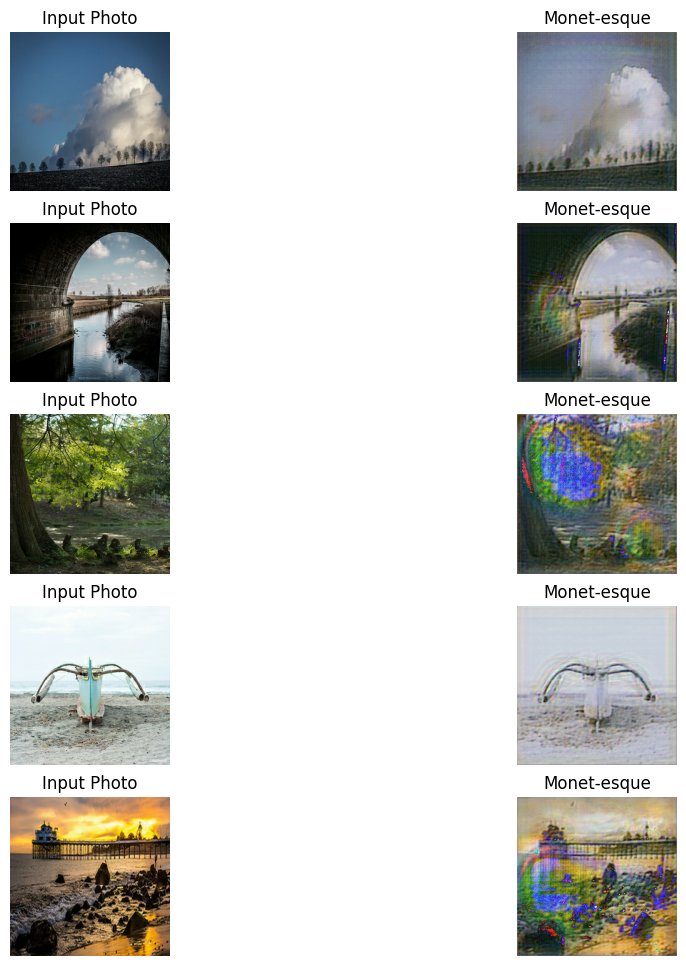

In [20]:
plot_results(monet_generator3)

while there's some funny stuff going on, this new Generator has some promise.

## The Royale With Cheese
How about my generator plus my discriminator?

In [21]:
with strategy.scope():
    monet_generator4 = get_connected_unet()# transforms photos to Monet-esque paintings
    photo_generator4 = get_connected_unet() # transforms Monet paintings to be more like photos

    monet_discriminator4 = getAltDiscriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator4 = getAltDiscriminator() # differentiates real photos and generated photos
    to_monet = monet_generator4(example_photo)
    
    monet_generator_optimizer = tf.keras.optimizers.Adam()#2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam()#2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam()#2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam()#2e-4, beta_1=0.5)

    cycle_gan_model4 = CycleGan(
        monet_generator4, photo_generator4, 
        monet_discriminator4, photo_discriminator4
    )

    cycle_gan_model4.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )
    
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#     filepath="/kaggle/working/checkpoint{epoch:02d}.model3.keras",
#     save_freq=600)
    class CustomCallback(keras.callbacks.Callback):
        def on_epoch_end(self, epoch, logs=None):
            self.model.m_gen.save(f"royale{epoch}.keras")
            plot_results(self.model.m_gen)
    if not USE_CACHED_MODELS:
        hist4 = cycle_gan_model4.fit(
            tf.data.Dataset.zip((monet_ds, photo_ds)),
            callbacks=[CustomCallback()],
            epochs=25
        )
        monet_generator4.save("monet_generator4royale.keras")
    else:
        # take the 5th generation so we're comparing head to head
        monet_generator4 = tf.keras.models.load_model("royale5.keras")

# Head to head comparison of different models

here are all four models after 5 epochs of training.

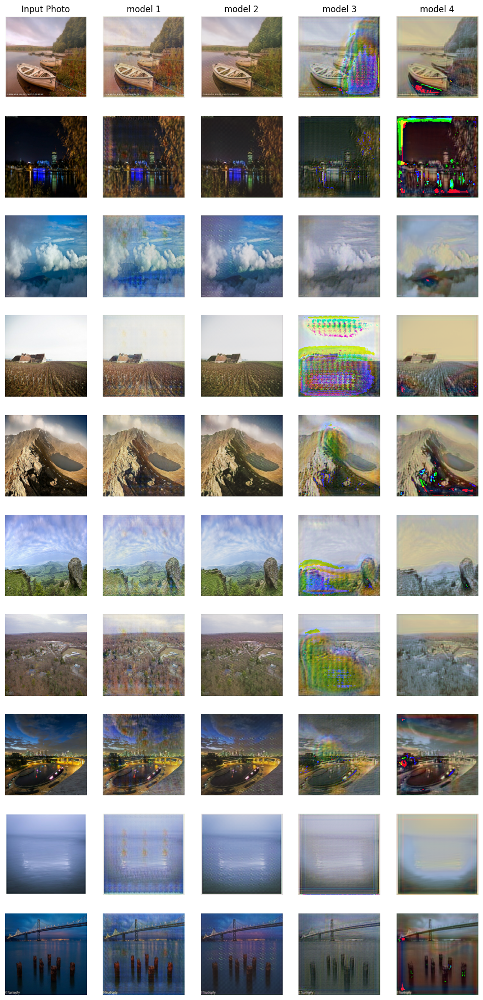

In [22]:
def head_to_head(monet_models, num_photos=5, skip=0):
    fig_height = round(2.5 * num_photos)
    _, ax = plt.subplots(num_photos, len(monet_models)+1, figsize=(12, fig_height))
    ret = []
    ax[0, 0].set_title("Input Photo")
    for k, m in enumerate(monet_models):
        ax[0, k+1].set_title(f"model {k+1}")
    

    for i, img in enumerate(photo_ds.skip(skip).take(num_photos)):
            
        img_to_show = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
        ax[i, 0].imshow(img_to_show)
        ax[i,0].axis('off')
        
        for j, model in enumerate(monet_models):
            prediction = model(img, training=False)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            ax[i,j+1].imshow(prediction)
            ax[i,j+1].axis('off')
            ret.append(prediction)
    plt.show()
    return ret
    

models = [monet_generator1, monet_generator2, monet_generator3, monet_generator4]
ignore = head_to_head(models,num_photos=10,skip=40)
            

## another generator function

Well, all of the models have their moments. I would say model 2 (the base generator plus my new discriminator) is a little better than model 1 (base generator and discriminator). models 3 and 4 with the new generator are more interesting, but they have the tendency to go pathological and throw in a bunch of strange colors. here is model 4 over time. some epochs will be normal, some will not.

In [67]:
royales = [tf.keras.models.load_model(f"royale{i}.keras") for i in [2,4,8,16] ]

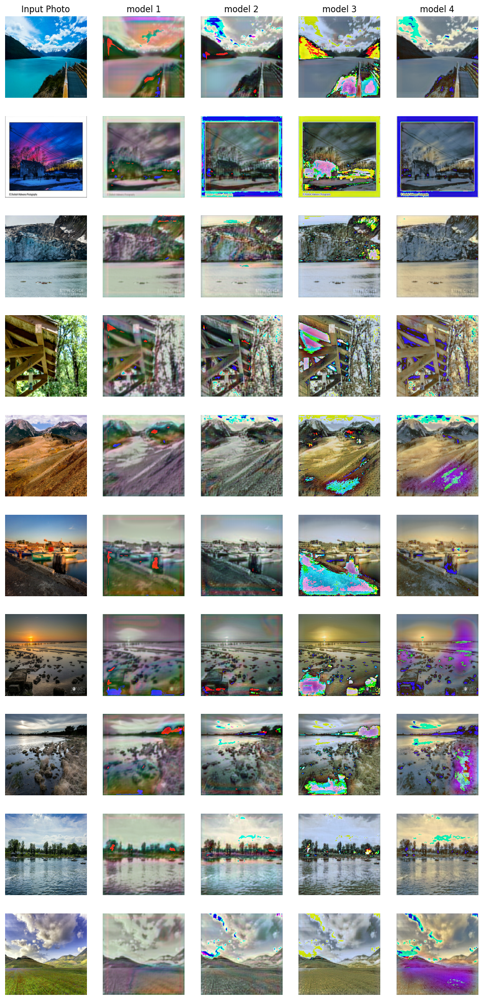

In [68]:
ignore=head_to_head(royales,skip=120, num_photos=10)

## EDA - Generated Photos
A natural question to ask is: what are those wacky colors? What does that tell us about the model?

In [25]:
royale16 = tf.keras.models.load_model(f"royale16.keras")

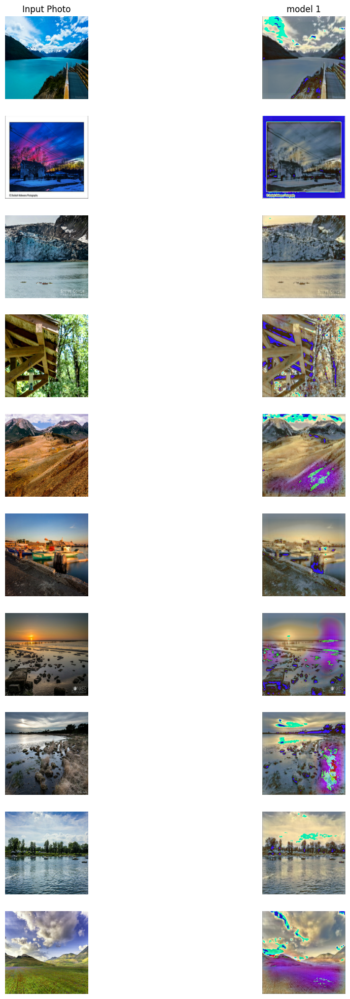

In [26]:
generated16 = head_to_head([royale16], skip=120, num_photos=10)

In [27]:
!pip install colorgram.py

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  Using cached colorgram.py-1.2.0-py2.py3-none-any.whl.metadata (4.6 kB)
Using cached colorgram.py-1.2.0-py2.py3-none-any.whl (6.2 kB)


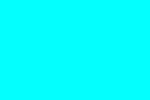

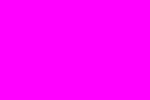

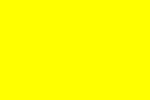

In [28]:
# taken from 
# https://stackoverflow.com/questions/20548590/python-imaging-library-can-i-simply-fill-my-image-with-one-color#49825484
# and https://pillow.readthedocs.io/en/latest/reference/ImageDraw.html
from PIL import Image, ImageDraw


out = Image.new("RGB", (150, 100), (1, 255, 255))
d = ImageDraw.Draw(out)
display(out)


out = Image.new("RGB", (150, 100), (255, 1, 255))
d = ImageDraw.Draw(out)
display(out)

out = Image.new("RGB", (150, 100), (255, 255, 1))
d = ImageDraw.Draw(out)
display(out)


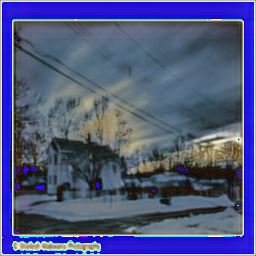

Rgb(r=84, g=102, b=119)


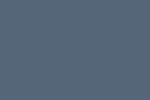

Rgb(r=30, g=16, b=214)


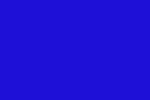

Rgb(r=39, g=48, b=54)


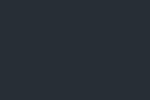

Rgb(r=41, g=34, b=23)


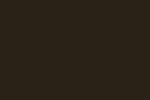

Rgb(r=166, g=162, b=141)


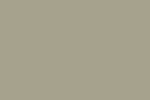

Rgb(r=35, g=43, b=40)


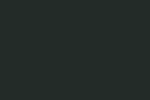

Rgb(r=106, g=101, b=81)


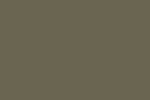

Rgb(r=232, g=228, b=201)


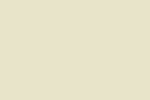

Rgb(r=92, g=101, b=97)


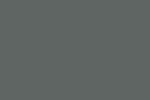

Rgb(r=27, g=25, b=243)


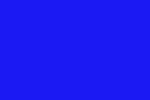

In [29]:
import PIL
import colorgram
image16 = PIL.Image.fromarray(generated16[1])
color16 = colorgram.extract(image16, 10)

display(image16)

def draw_swath(r,g,b):
    out = Image.new("RGB", (150, 100), (r,g,b))
    d = ImageDraw.Draw(out)
    display(out)

for color in color16:
    print(repr(color.rgb))
    draw_swath(color.rgb.r, color.rgb.g, color.rgb.b)
    


compare to the original:

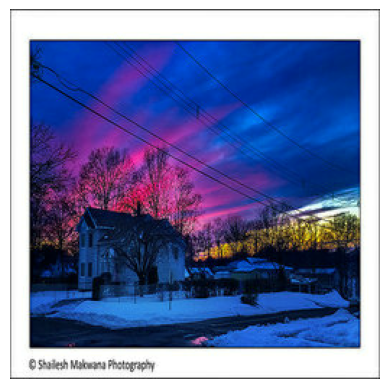

Rgb(r=14, g=53, b=156)


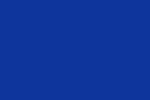

Rgb(r=252, g=252, b=251)


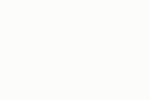

Rgb(r=8, g=24, b=59)


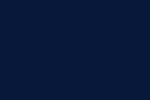

Rgb(r=40, g=80, b=179)


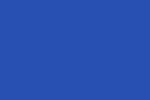

Rgb(r=135, g=57, b=134)


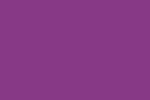

Rgb(r=247, g=252, b=250)


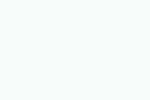

Rgb(r=98, g=87, b=67)


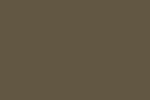

Rgb(r=56, g=24, b=55)


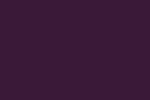

Rgb(r=52, g=115, b=217)


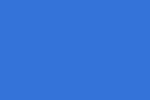

Rgb(r=105, g=37, b=103)


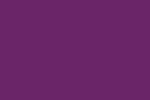

In [30]:
_, ax = plt.subplots(1)#num_photos, len(monet_models)+1, figsize=(12, fig_height))
    

for i, img in enumerate(photo_ds.skip(121).take(1)):
    img_to_show = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
    ax.imshow(img_to_show)
    ax.axis('off')
plt.show()

original_colors = colorgram.extract(PIL.Image.fromarray(img_to_show), 10)
    
for color in original_colors:
    print(repr(color.rgb))
    draw_swath(color.rgb.r, color.rgb.g, color.rgb.b)

I'll omit some of playing I did with this function. The color analysis is a little slow, so I can't really do it in bulk. and it would be more useful if it bucketed the colors by say rounding the rgb values to the nearest 10. But what I observe is the "weird" colors in the generated images are all ones where one channel has a really high value and the other two have low values.

## A Final Generator Model Tweak
So, I think the extreme colors might be because it's not able to learn more moderate color values. So I switched the activations on the last batch of layers to leaky_relu and added a BatchNormalization at the end. After some experimentation with learning rates, I also switched to the RMSProp algorithm for the generators.

My changes were a bit arbitrary, but they did improve things.

In [31]:
from keras.layers import Input, concatenate, Conv2D, Add, MaxPooling2D, Conv2DTranspose, BatchNormalization, GroupNormalization
from keras.models import Model

def get_connected_unet2():
    def aspp_block(x, num_filters, rate_scale=1):
        x1 = Conv2D(num_filters, (3, 3), dilation_rate=(6 * rate_scale, 6 * rate_scale), padding="same")(x)
        x1 = BatchNormalization()(x1)

        x2 = Conv2D(num_filters, (3, 3), dilation_rate=(12 * rate_scale, 12 * rate_scale), padding="same")(x)
        x2 = BatchNormalization()(x2)

        x3 = Conv2D(num_filters, (3, 3), dilation_rate=(18 * rate_scale, 18 * rate_scale), padding="same")(x)
        x3 = BatchNormalization()(x3)

        x4 = Conv2D(num_filters, (3, 3), padding="same")(x)
        x4 = BatchNormalization()(x4)

        y = Add()([x1, x2, x3, x4])
        y = Conv2D(num_filters, (1, 1), padding="same")(y)
        return y 

    def get_wnet():
        inputs = Input((256, 256, 3))
        conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
        conv1 = BatchNormalization()(conv1)
        conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
        conv1 = BatchNormalization()(conv1)
        pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

        conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
        conv2 = BatchNormalization()(conv2)
        conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
        conv2 = BatchNormalization()(conv2)
        pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

        conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
        conv3 = BatchNormalization()(conv3)
        conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
        conv3 = BatchNormalization()(conv3)
        pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

        conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
        conv4 = BatchNormalization()(conv4)
        conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
        conv4 = BatchNormalization()(conv4)
        pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

        conv5 = aspp_block(pool4, 512)

        up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
        conv6 = BatchNormalization()(conv6)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)
        conv6 = BatchNormalization()(conv6)

        up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
        conv7 = BatchNormalization()(conv7)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)
        conv7 = BatchNormalization()(conv7)

        up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
        conv8 = BatchNormalization()(conv8)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)
        conv8 = BatchNormalization()(conv8)

        up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
        conv9 = BatchNormalization()(conv9)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)
        conv9 = BatchNormalization()(conv9)

        down10 = concatenate([Conv2D(32, (3, 3), activation='relu', padding='same')(conv9), conv9], axis=3)
        conv10 = Conv2D(32, (3, 3), activation='relu', padding='same')(down10)
        conv10 = BatchNormalization()(conv10)
        conv10 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv10)
        conv10 = BatchNormalization()(conv10)    
        pool10 = MaxPooling2D(pool_size=(2, 2))(conv10)

        down11 = concatenate([Conv2D(64, (3, 3), activation='relu', padding='same')(pool10), conv8], axis=3)
        conv11 = Conv2D(64, (3, 3), activation='relu', padding='same')(down11)
        conv11 = BatchNormalization()(conv11)
        conv11 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv11)
        conv11 = BatchNormalization()(conv11)   
        pool11 = MaxPooling2D(pool_size=(2, 2))(conv11)

        down12 = concatenate([Conv2D(128, (3, 3), activation='relu', padding='same')(pool11), conv7], axis=3)
        conv12 = Conv2D(128, (3, 3), activation='relu', padding='same')(down12)
        conv12 = BatchNormalization()(conv12)
        conv12 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv12)    
        conv12 = BatchNormalization()(conv12)
        pool12 = MaxPooling2D(pool_size=(2, 2))(conv12)

        down13 = concatenate([Conv2D(256, (3, 3), activation='relu', padding='same')(pool12), conv6], axis=3)
        conv13 = Conv2D(256, (3, 3), activation='relu', padding='same')(down13)
        conv13 = BatchNormalization()(conv13)
        conv13 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv13)  
        conv13 = BatchNormalization()(conv13)    
        pool13 = MaxPooling2D(pool_size=(2, 2))(conv13)

        conv14 = aspp_block(pool13, 512)

        up15 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv14), conv13], axis=3)
        conv15 = Conv2D(256, (3, 3), activation='relu', padding='same')(up15)
        conv15 = BatchNormalization()(conv15)    
        conv15 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv15)
        conv15 = BatchNormalization()(conv15)
        
        #casey: switched these to leaky relu, I think the relus are forcing the more 
        #extreme primary color patches.
        up16 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv15), conv12], axis=3)
        conv16 = Conv2D(128, (3, 3), activation='leaky_relu', padding='same')(up16)
        conv16 = BatchNormalization()(conv16)     
        conv16 = Conv2D(128, (3, 3), activation='leaky_relu', padding='same')(conv16)
        conv16 = BatchNormalization()(conv16)      

        up17 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv16), conv11], axis=3)
        conv17 = Conv2D(64, (3, 3), activation='leaky_relu', padding='same')(up17)
        conv17 = BatchNormalization()(conv17)      
        conv17 = Conv2D(64, (3, 3), activation='leaky_relu', padding='same')(conv17)
        conv17 = BatchNormalization()(conv17)  


        up18 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv17), conv10], axis=3)
        conv18 = Conv2D(32, (3, 3), activation='leaky_relu', padding='same')(up18)
        conv18 = BatchNormalization()(conv18)      
        conv18 = Conv2D(32, (3, 3), activation='leaky_relu', padding='same')(conv18)
        conv18 = BatchNormalization()(conv18)
        
        conv18 = aspp_block(conv18, 3)
        conv19 = BatchNormalization()(conv18)

        model = Model(inputs=[inputs], outputs=[conv19])
        return model
    return get_wnet()

In [63]:
import json

with strategy.scope():
    monet_generator5 = get_connected_unet2()# transforms photos to Monet-esque paintings
    photo_generator5 = get_connected_unet2() # transforms Monet paintings to be more like photos

    monet_discriminator5 = getAltDiscriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator5 = getAltDiscriminator() # differentiates real photos and generated photos
    
    monet_generator_optimizer = tf.keras.optimizers.RMSprop()#Adam()#2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.RMSprop()#.Adam()#2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam()#2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam()#2e-4, beta_1=0.5)

    cycle_gan_model5 = CycleGan(
        monet_generator5, photo_generator5, 
        monet_discriminator5, photo_discriminator5
    )

    cycle_gan_model5.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )
    

    class CustomCallback(keras.callbacks.Callback):
        def on_epoch_end(self, epoch, logs=None):
            self.model.m_gen.save(f"model5.{epoch}.keras")
            #plot_results(self.model.m_gen)
            
if True:#fixme
    hist5 = cycle_gan_model5.fit(
        tf.data.Dataset.zip((monet_ds, photo_ds)),
        callbacks=[CustomCallback()],
        epochs=25
    )
    monet_generator5.save("monet_generator5b.keras")

else:
    monet_generator5 = tf.keras.models.load_model("monet_generator5.keras")

Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 278s 497ms/step - cycle_loss: 8.4977 - monet_disc_loss: 0.1752 - monet_gen_loss: 13.9166 - monet_identity_loss: 2.0035 - photo_disc_loss: 0.1573 - photo_gen_loss: 14.3078 - photo_identity_loss: 2.2881
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 496ms/step - cycle_loss: 7.5026 - monet_disc_loss: 0.6618 - monet_gen_loss: 10.4108 - monet_identity_loss: 1.7213 - photo_disc_loss: 0.6863 - photo_gen_loss: 10.5465 - photo_identity_loss: 1.9977
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 497ms/step - cycle_loss: 6.0543 - monet_disc_loss: 0.6754 - monet_gen_loss: 8.2670 - monet_identity_loss: 1.3702 - photo_disc_loss: 0.6674 - photo_gen_loss: 8.3923 - photo_identity_loss: 1.5502
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 497ms/step - cycle_loss: 5.4847 - monet_disc_loss: 0.6341 - monet_gen_loss: 7.5372 - monet_identity_loss: 1.2074 - photo_disc_loss: 0.6500 - photo_gen_loss: 7.7322 - photo_identity_loss: 1.4469
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 497ms/step - cycle_loss: 5.1876 - monet_disc_loss: 0.3870 - monet_gen_loss: 8.0039 - monet_identity_loss: 1.2053 - photo_disc_loss: 0.5198 - photo_gen_loss: 7.6988 - photo_identity_loss: 1.3971
Epoch 21/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 498ms/step - cycle_loss: 5.2151 - monet_disc_loss: 0.3662 - monet_gen_loss: 8.1470 - monet_identity_loss: 1.2050 - photo_disc_loss: 0.4904 - photo_gen_loss: 7.9044 - photo_identity_loss: 1.4189
Epoch 23/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 498ms/step - cycle_loss: 5.1903 - monet_disc_loss: 0.3719 - monet_gen_loss: 8.0475 - monet_identity_loss: 1.1876 - photo_disc_loss: 0.5831 - photo_gen_loss: 7.7232 - photo_identity_loss: 1.4625
Epoch 24/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 498ms/step - cycle_loss: 5.2007 - monet_disc_loss: 0.3618 - monet_gen_loss: 8.1534 - monet_identity_loss: 1.2024 - photo_disc_loss: 0.5389 - photo_gen_loss: 7.7595 - photo_identity_loss: 1.4591
Epoch 25/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 151s 498ms/

In [ ]:
mogens = [tf.keras.models.load_model(f"model5.{epoch}.keras") for epoch in [1,6,12,18,24]]


## Visualizing model training progress

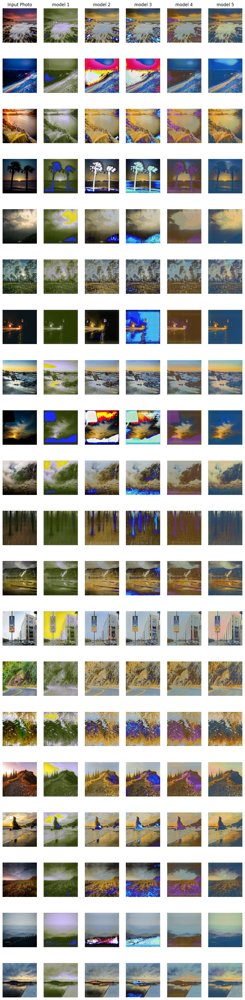

In [65]:
ignore = head_to_head(mogens,skip=229, num_photos=20)

Above are the original images, then the 1st, 6th, 12th, 18th and 24th generations.

Although it takes quite a few epochs to get away from the big splotches of bright color, I think the end result is fairly "painterly". It looks more like something a human did rather than a hallucinating robot.

### You wanted a graph...
A big problem is the loss numbers don't really track with how good the images are. Epoch 24 is way better than epoch 12. But you can't tell that from the numbers.

```Epoch 12/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 154s 494ms/step - cycle_loss: 5.2868 - monet_disc_loss: 0.4312 - monet_gen_loss: 7.9524 - monet_identity_loss: 1.1905 - photo_disc_loss: 0.4790 - photo_gen_loss: 7.9917 - photo_identity_loss: 1.4061
```

```Epoch 24/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 154s 493ms/step - cycle_loss: 5.2948 - monet_disc_loss: 0.3971 - monet_gen_loss: 8.1387 - monet_identity_loss: 1.2201 - photo_disc_loss: 0.5448 - photo_gen_loss: 7.9938 - photo_identity_loss: 1.5263
```

The cycle_loss, monet_gen_loss and photo_gen_loss are all worse in epoch 24 than epoch 12 even though the output is (subjectively) better. Unlike other deep learning problems we've done in this class, it's not obvious when to stop training. Another 24 epochs and it might be perfect, or it might be useless.

I ended up training the final model 4 times. 3 times it was looking very good at the end; one time it was still putting blotches of hot pink and red in images. So there is an element of luck to the training.

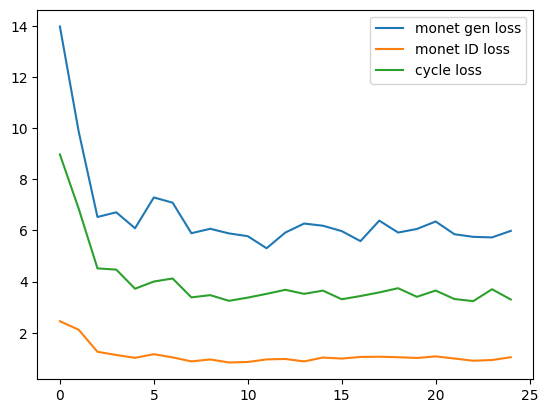

In [66]:


gen_loss_history = np.mean(hist5.history['monet_gen_loss'],axis=3)

monet_gen_history = []
for x in hist5.history['monet_gen_loss']:
    monet_gen_history.append(np.mean(x))
    
monet_id_history = []
for x in hist5.history['monet_identity_loss']:
    monet_id_history.append(np.mean(x))

plt.plot(monet_gen_history, label="monet gen loss")
plt.plot(monet_id_history, label="monet ID loss")
plt.plot(hist5.history['cycle_loss'], label="cycle loss")
plt.legend()
plt.show()

The ID and cycle loss numbers being stable makes sense because they're meant to keep the system from going off the rails, not assess how good the transformation is. But the generator loss staying flat is somewhat surprising to me.

## Data Augmentation to the Rescue?
I made another notebook for the final submission: https://www.kaggle.com/code/caseydurfee/monet-contest-submission

After submitting and getting a respectable score (69.5), I tried using Diff Augment to make the training data more robust, as detailed in this notebook: https://www.kaggle.com/code/unfriendlyai/diffaugment-is-all-you-need
With the augmented data, I got a score of 80, which is worse. It's not clear to me why augmented data led to a worse model, though there is an element of chance to the training. another run with diffaugment might get a better result.

## Conclusions and Next Steps
We still have a learning rate issue here, I think. I experimented with 3 different optimizers: Adam with the starting learning rate from the intro notebook, Adam with default settings, and RMSProp. None of them seemed ideal.

I think there's probably a better solution using adaptive learning rates so it doesn't keep cycling between OK and bad models in the later epochs of training. If the model isn't repeatable, I'm not sure we've solved the problem in a truly unsupervised way.

I think better tools for visualizing what it's doing while training would help. I'm still not clear on where the garish colors are coming from. 

It may be possible to initialize the model with more monet-like colors. Perhaps this could be done by having another GAN that learns a mapping of colors in the real photos to colors in the monet paintings. The generator of the 2nd GAN would take an image and generate a plausible palette of colors to use in the transformation. For each photo, generate the more monet like versions of those colors. And for each monet, generate the more photo-like versions of those colors. The learned mapping would then be fed into generator of the first GAN. There would be an additional loss function that would penalize drawing colors that are outside the monet-like spectrum.

I think the combination of Generator and Discriminator architectures matters. With a bunch more time, I could've tested more combinations of architectures. Perhaps there's a perfect combo out there that's better than the sum of its parts, like John Lennon and Paul McCartney.

# Create submission file

the actual submission is in this notebook: https://www.kaggle.com/code/caseydurfee/monet-contest-submission

In [ ]:
import zipfile

In [ ]:
import os
os.getcwd()

In [ ]:
import PIL
import io
from tqdm import tqdm
SELECTED_MONET_GENERATOR = monet_generator5
if False:
    with zipfile.ZipFile('/kaggle/working/images.zip', 'w') as zipped_f:
        for i, img in tqdm(enumerate(photo_ds), total=7100):
            prediction = SELECTED_MONET_GENERATOR(img, training=False)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            im = PIL.Image.fromarray(prediction)

            file_object = io.BytesIO()
            im.save(file_object, "JPEG")
            im.close()

            zipped_f.writestr(str(i) + ".jpg", file_object.getvalue())


# Sources
* https://stackoverflow.com/questions/40886234/how-to-directly-add-file-to-zip-in-python
* https://github.com/eriklindernoren/Keras-GAN
* [Zhu 2017] https://arxiv.org/abs/1703.10593
https://www.kaggle.com/code/unfriendlyai/diffaugment-is-all-you-need
* [Baccouche 2021] https://www.nature.com/articles/s41523-021-00358-x
* https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial